In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('/Users/dodkins/PythonProjects/stocks/options_testing/options_testing')

import os
from datetime import datetime 
import pandas as pd
import opstrat as op

from robinhood import get_options_plays
from yahoo import get_tsla 
from plots import plot_candles, plot_line, plot
from options import get_option_history, weekly_short_calls, LEAPS
from utils import aggregate
from quantconnect import load_tsla_hourly

In [2]:
tsla = load_tsla_hourly()

In [3]:
import plotly.express as px

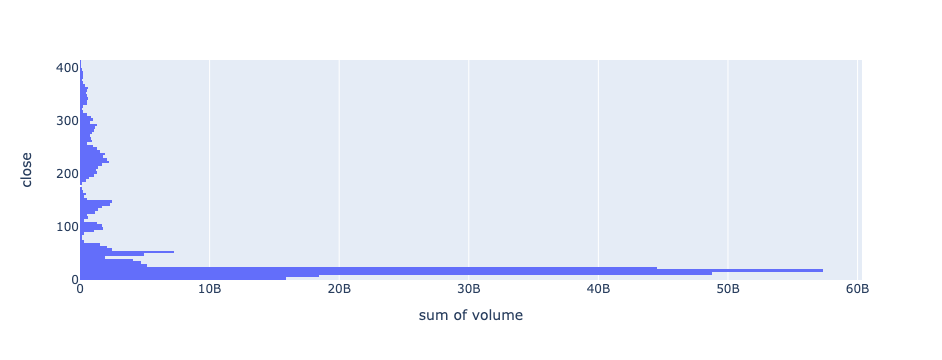

In [4]:
px.histogram(tsla, x='volume', y='close', nbins=150, orientation='h').show()

In [5]:
tsla.iloc[-6000:]

,open,high,low,close,volume
datetime,,,,,
2019-04-16 12:00:00,18.105998,18.166665,18.051332,18.163998,14269651.0
2019-04-16 13:00:00,18.160665,18.246665,18.110665,18.217998,13315246.0
2019-04-16 14:00:00,18.219332,18.315998,18.203332,18.287332,12976426.0
2019-04-16 15:00:00,18.290665,18.333331,18.230665,18.230665,11424346.0
2019-04-16 16:00:00,18.229998,18.256665,18.107998,18.223998,17270027.0
...,...,...,...,...,...
2022-09-13 12:00:00,293.680000,293.990000,290.400000,291.000000,7883773.0
2022-09-13 13:00:00,291.000000,293.280000,290.670000,292.300000,5298142.0
2022-09-13 14:00:00,292.270000,295.500000,291.780000,294.830000,9703434.0


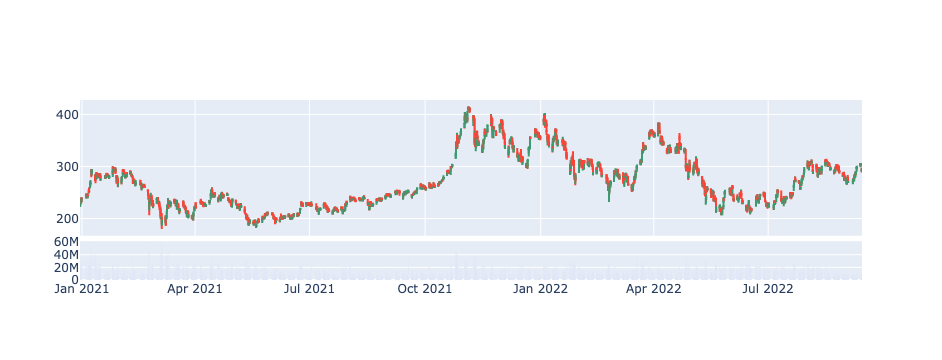

In [6]:
plot(tsla.iloc[-3000:])

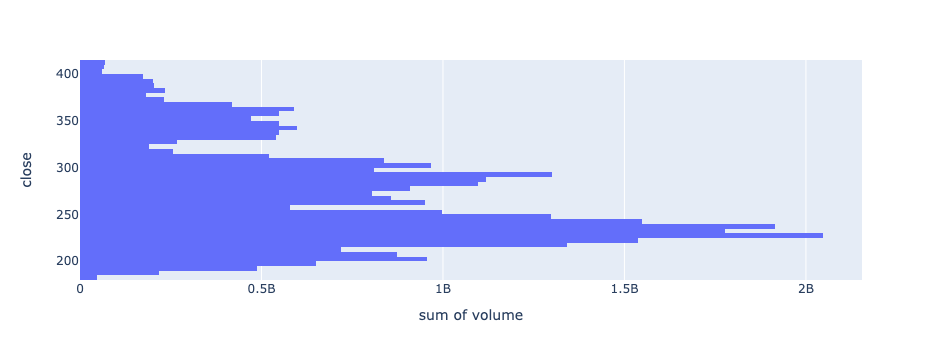

In [7]:
px.histogram(tsla.iloc[-3000:], x='volume', y='close', nbins=100, orientation='h').show()

In [8]:
recent = tsla.iloc[-3000:]

In [10]:
import pandas as pd
import numpy as np
from scipy import stats, signal
import plotly.express as px
import plotly.graph_objects as go

kde_factor = 0.05
num_samples = 500
kde = stats.gaussian_kde(recent['close'],weights=recent['volume'],bw_method=kde_factor)
xr = np.linspace(recent['close'].min(),recent['close'].max(),num_samples)
kdy = kde(xr)
ticks_per_sample = (xr.max() - xr.min()) / num_samples

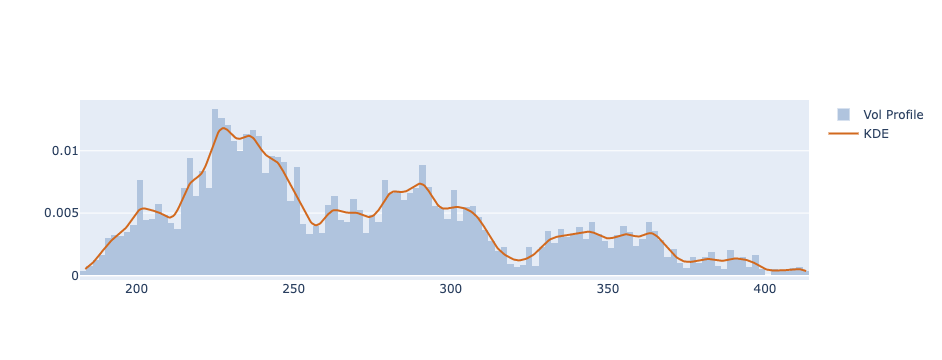

In [11]:
def get_dist_plot(c, v, kx, ky):
    fig = go.Figure()
    fig.add_trace(go.Histogram(name='Vol Profile', x=c, y=v, nbinsx=150, 
                               histfunc='sum', histnorm='probability density',
                               marker_color='#B0C4DE'))
    fig.add_trace(go.Scatter(name='KDE', x=kx, y=ky, mode='lines', marker_color='#D2691E'))
    return fig

get_dist_plot(recent['close'], recent['volume'], xr, kdy).show()

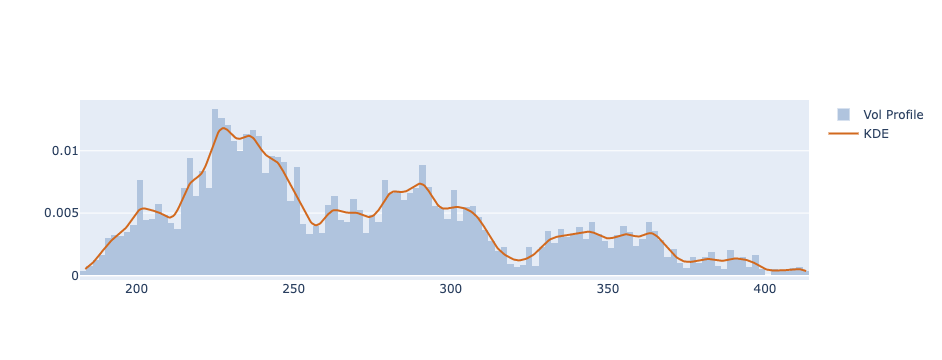

In [13]:
from plots import get_dist_plot
get_dist_plot(recent['close'], recent['volume'], xr, kdy).show()

In [ ]:
    pk_marker_args = dict(size=10)
    fig = get_dist_plot(df['close'], df['volume'], xr, kdy)
    fig.add_trace(go.Scatter(name="Peaks", x=pkx, y=pky, mode='markers', marker=pk_marker_args))

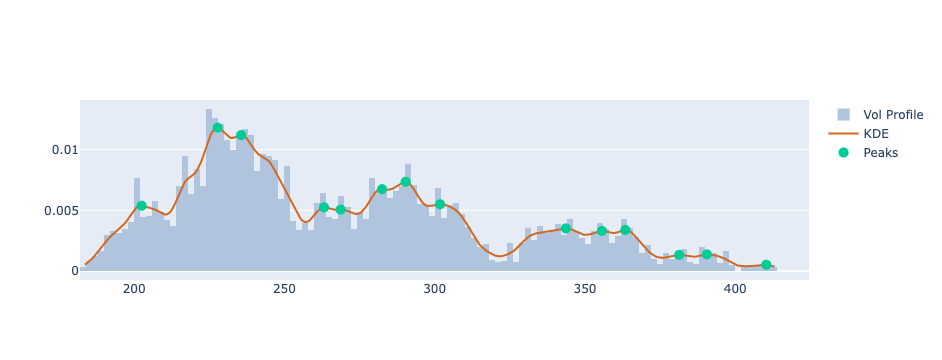

In [14]:
peaks,_ = signal.find_peaks(kdy)
pkx = xr[peaks]
pky = kdy[peaks]

pk_marker_args=dict(size=10)
fig = get_dist_plot(recent['close'], recent['volume'], xr, kdy)
fig.add_trace(go.Scatter(name="Peaks", x=pkx, y=pky, mode='markers', marker=pk_marker_args))

In [15]:
pkx

array([202.51706058, 227.804199  , 235.6202236 , 263.20619278,
       268.72338662, 282.51637121, 290.33239582, 301.82654964,
       343.66526957, 355.61918955, 363.43521416, 381.36609413,
       390.56141719, 410.33136177])

In [16]:
plot_candles(recent, pivots=pkx, thicknesses=pky/0.0118)

TypeError: plot_candles() got an unexpected keyword argument 'thicknesses'

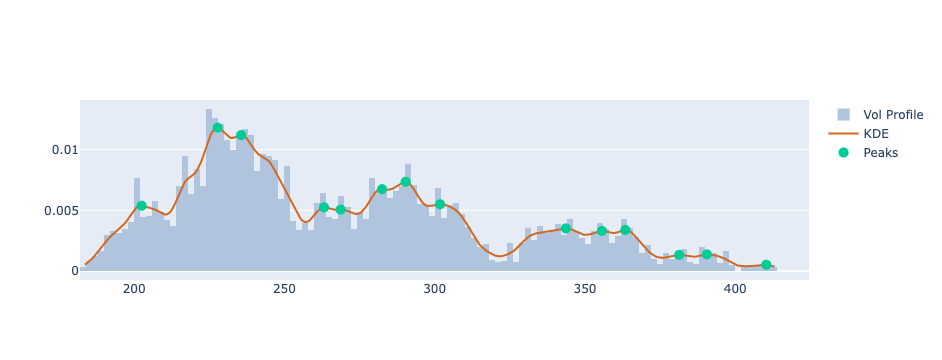

In [18]:
from plots import plot_KDE
from technical_analysis import KDE_profile
kde_p = KDE_profile(recent)
plot_KDE(recent, *kde_p)

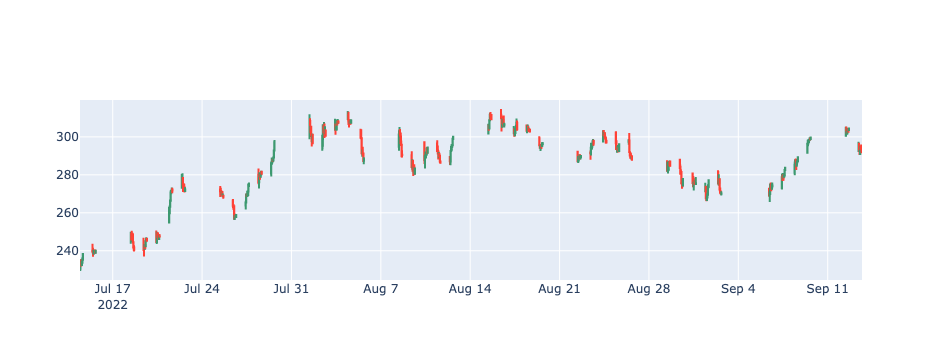

In [19]:
recent = tsla.iloc[-300:]
plot_candles(recent, show_volume=False)

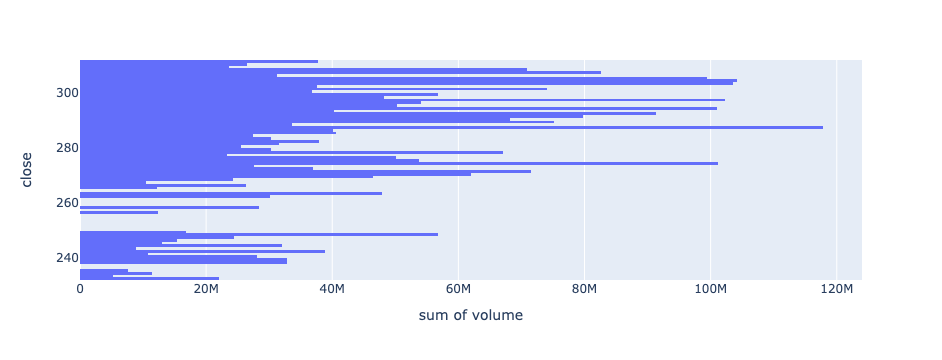

In [20]:
from plots import volume_profile
volume_profile(recent)

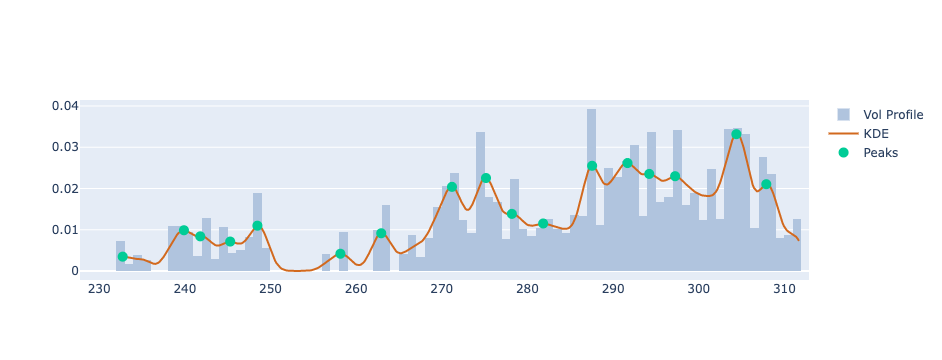

In [21]:
kde_p = KDE_profile(recent)
plot_KDE(recent, *kde_p)

In [22]:
kde_p

(array([232.74770552, 239.8966026 , 241.80297515, 245.2979915 ,
        248.47527909, 258.16600625, 262.93193763, 271.19288537,
        275.16449486, 278.18291807, 281.8367988 , 287.55591647,
        291.68639034, 294.22822041, 297.24664362, 304.3955407 ,
        307.89055705]),
 array([0.00348142, 0.00987713, 0.00840222, 0.00714154, 0.01098668,
        0.00418632, 0.00915195, 0.02039839, 0.02254028, 0.01385002,
        0.01151992, 0.02550649, 0.02616749, 0.02353158, 0.02298175,
        0.03317141, 0.02104359]),
 array([232.42997676, 232.58884114, 232.74770552, 232.9065699 ,
        233.06543428, 233.22429865, 233.38316303, 233.54202741,
        233.70089179, 233.85975617, 234.01862055, 234.17748493,
        234.33634931, 234.49521369, 234.65407807, 234.81294245,
        234.97180683, 235.13067121, 235.28953559, 235.44839997,
        235.60726435, 235.76612873, 235.92499311, 236.08385749,
        236.24272187, 236.40158625, 236.56045063, 236.71931501,
        236.87817938, 237.03704376

In [23]:
max(kde_p[1])

0.03317140516743251

In [34]:
from technical_analysis import get_poc

In [32]:
len(recent)

300

In [27]:
def get_poc(df, window_size=300):
    n_stride = len(df)-window_size
    developing_poc = pd.DataFrame(index=df.index[window_size:], columns=['poc'])
    for i in range(n_stride):
        pkx, pky, _, _ = KDE_profile(df.iloc[i:i+window_size])
        developing_poc.at[df.index[i+window_size],'poc'] = pkx[np.argmax(pky)]
    return developing_poc

In [39]:
recent = tsla.iloc[-1000:]

In [40]:
poc = get_poc(recent)

In [41]:
poc

,poc
datetime,
2022-04-21 10:00:00,333.014943
2022-04-21 11:00:00,333.014943
2022-04-21 12:00:00,333.014943
2022-04-21 13:00:00,333.014943
2022-04-21 14:00:00,333.014943
...,...
2022-09-13 12:00:00,304.389976
2022-09-13 13:00:00,304.389976
2022-09-13 14:00:00,304.389976


In [42]:
len(poc)

700

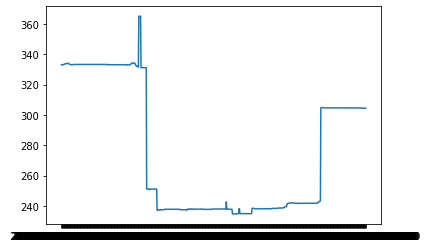

In [43]:
plt.plot(poc)

In [44]:
poc.index

Index([' 2022-04-21 10:00:00', ' 2022-04-21 11:00:00', ' 2022-04-21 12:00:00',
       ' 2022-04-21 13:00:00', ' 2022-04-21 14:00:00', ' 2022-04-21 15:00:00',
       ' 2022-04-21 16:00:00', ' 2022-04-22 10:00:00', ' 2022-04-22 11:00:00',
       ' 2022-04-22 12:00:00',
       ...
       ' 2022-09-12 14:00:00', ' 2022-09-12 15:00:00', ' 2022-09-12 16:00:00',
       ' 2022-09-13 10:00:00', ' 2022-09-13 11:00:00', ' 2022-09-13 12:00:00',
       ' 2022-09-13 13:00:00', ' 2022-09-13 14:00:00', ' 2022-09-13 15:00:00',
       ' 2022-09-13 16:00:00'],
      dtype='object', name='datetime', length=700)

In [45]:
recent['poc'] = np.nan

In [46]:
recent.loc[poc.index]

,open,high,low,close,volume,poc
datetime,,,,,,
2022-04-21 10:00:00,358.533297,364.073297,353.833298,357.569964,23957396.0,NaN
2022-04-21 11:00:00,357.519964,358.909964,350.256632,352.263298,18625751.0,NaN
2022-04-21 12:00:00,352.269965,352.509965,345.356632,345.689965,12602620.0,NaN
2022-04-21 13:00:00,345.749965,347.439965,343.326632,344.546632,8857858.0,NaN
2022-04-21 14:00:00,344.546632,347.166632,342.313299,342.716632,7482388.0,NaN
...,...,...,...,...,...,...
2022-09-13 12:00:00,293.680000,293.990000,290.400000,291.000000,7883773.0,NaN
2022-09-13 13:00:00,291.000000,293.280000,290.670000,292.300000,5298142.0,NaN
2022-09-13 14:00:00,292.270000,295.500000,291.780000,294.830000,9703434.0,NaN


In [47]:
len(poc['poc'].array), len(recent.loc[poc.index])

(700, 700)

In [48]:
recent.loc[poc.index, 'poc']

datetime
 2022-04-21 10:00:00   NaN
 2022-04-21 11:00:00   NaN
 2022-04-21 12:00:00   NaN
 2022-04-21 13:00:00   NaN
 2022-04-21 14:00:00   NaN
                        ..
 2022-09-13 12:00:00   NaN
 2022-09-13 13:00:00   NaN
 2022-09-13 14:00:00   NaN
 2022-09-13 15:00:00   NaN
 2022-09-13 16:00:00   NaN
Name: poc, Length: 700, dtype: float64

In [49]:
recent.loc[poc.index, 'poc'] = poc['poc'].array

In [50]:
recent

,open,high,low,close,volume,poc
datetime,,,,,,
2022-02-17 11:00:00,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN
2022-02-17 12:00:00,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN
2022-02-17 13:00:00,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN
2022-02-17 14:00:00,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN
2022-02-17 15:00:00,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN
...,...,...,...,...,...,...
2022-09-13 12:00:00,293.680000,293.990000,290.400000,291.000000,7883773.0,304.389976
2022-09-13 13:00:00,291.000000,293.280000,290.670000,292.300000,5298142.0,304.389976
2022-09-13 14:00:00,292.270000,295.500000,291.780000,294.830000,9703434.0,304.389976


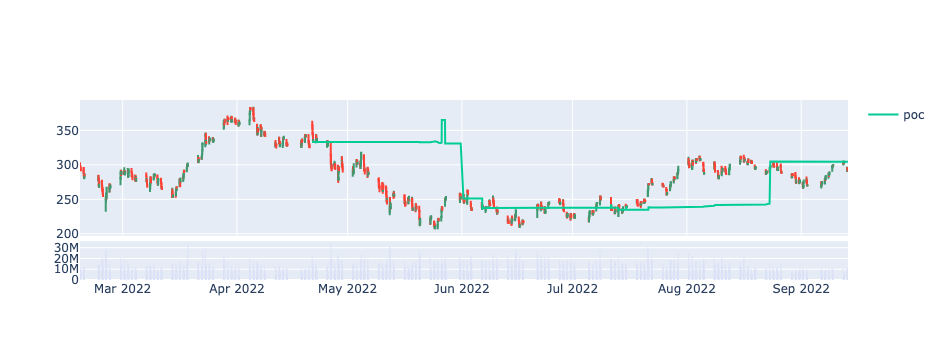

In [51]:
plot_candles(recent, lines=['poc'])

In [52]:
from technical_analysis import get_poc
from utils import concat_dfs

In [53]:
r = concat_dfs(recent, get_poc(recent, 30))

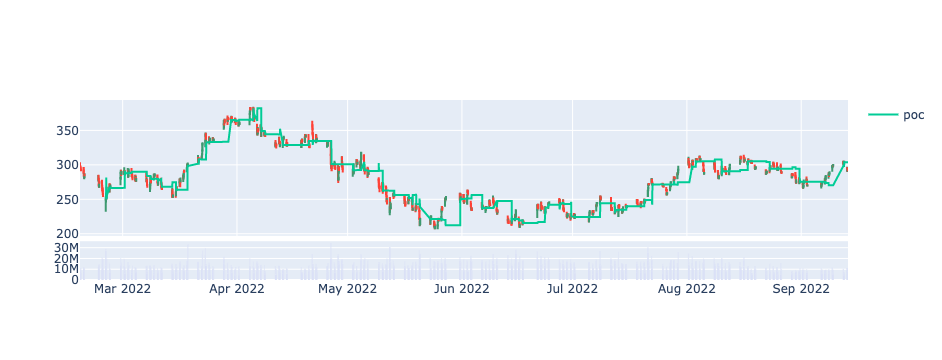

In [54]:
plot_candles(r, lines=['poc'])

In [55]:
r

,open,high,low,close,volume,poc
datetime,,,,,,
2022-02-17 11:00:00,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN
2022-02-17 12:00:00,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN
2022-02-17 13:00:00,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN
2022-02-17 14:00:00,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN
2022-02-17 15:00:00,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN
...,...,...,...,...,...,...
2022-09-13 12:00:00,293.680000,293.990000,290.400000,291.000000,7883773.0,304.057996
2022-09-13 13:00:00,291.000000,293.280000,290.670000,292.300000,5298142.0,304.057996
2022-09-13 14:00:00,292.270000,295.500000,291.780000,294.830000,9703434.0,304.017575


In [65]:
recent.head()

,open,high,low,close,volume,poc
datetime,,,,,,
2022-02-17 11:00:00,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN
2022-02-17 12:00:00,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN
2022-02-17 13:00:00,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN
2022-02-17 14:00:00,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN
2022-02-17 15:00:00,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN


In [57]:
df = recent
percent_offset=5
window = 30
short_call = concat_dfs(df, get_poc(df, window))
short_call = short_call.rename(columns={'open': 'underlying open', 'high': 'underlying high',
                                        'low': 'underlying low', 'close': 'underlying close'})
# short_call['diff'] = short_call['poc'].diff()# * (1 + percent_offset / 100.)
short_call['strike'] = short_call['poc'] * (1 + percent_offset / 100.)
short_call['call open'] = np.nan
short_call['call close'] = np.nan
short_call['weekly profit'] = np.nan
short_call['date'] = short_call.index
short_call = short_call.reset_index(drop=True)


In [69]:
short_call

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,weekly profit,date
0,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 11:00:00
1,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 12:00:00
2,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 13:00:00
3,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 14:00:00
4,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 15:00:00
...,...,...,...,...,...,...,...,...,...,...,...
995,293.680000,293.990000,290.400000,291.000000,7883773.0,304.057996,319.260896,NaN,NaN,NaN,2022-09-13 12:00:00
996,291.000000,293.280000,290.670000,292.300000,5298142.0,304.057996,319.260896,NaN,NaN,NaN,2022-09-13 13:00:00
997,292.270000,295.500000,291.780000,294.830000,9703434.0,304.017575,319.218454,NaN,NaN,NaN,2022-09-13 14:00:00
998,294.830000,295.970000,293.000000,294.100000,7136008.0,304.017575,319.218454,NaN,NaN,NaN,2022-09-13 15:00:00


In [70]:
grouped = short_call.groupby(['date'])

In [140]:
recent

,open,high,low,close,volume,poc
datetime,,,,,,
2022-02-17 11:00:00,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN
2022-02-17 12:00:00,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN
2022-02-17 13:00:00,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN
2022-02-17 14:00:00,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN
2022-02-17 15:00:00,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN
...,...,...,...,...,...,...
2022-09-13 12:00:00,293.680000,293.990000,290.400000,291.000000,7883773.0,304.057996
2022-09-13 13:00:00,291.000000,293.280000,290.670000,292.300000,5298142.0,304.057996
2022-09-13 14:00:00,292.270000,295.500000,291.780000,294.830000,9703434.0,304.017575


In [154]:
g = pd.to_datetime(recent.index).week

In [160]:
g = recent.groupby(pd.to_datetime(recent.index).week)

In [162]:
pd.to_datetime(recent.index).week

Int64Index([ 7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
            ...
            37, 37, 37, 37, 37, 37, 37, 37, 37, 37],
           dtype='int64', name='datetime', length=1000)

In [172]:
recent['week'] = pd.to_datetime(recent.index).week

In [173]:
recent.head()

,open,high,low,close,volume,poc,week
datetime,,,,,,,
2022-02-17 11:00:00,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,7
2022-02-17 12:00:00,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,7
2022-02-17 13:00:00,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,7
2022-02-17 14:00:00,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,7
2022-02-17 15:00:00,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,7


In [175]:
r = recent.groupby('week')

In [179]:
recent

,open,high,low,close,volume,poc,week
datetime,,,,,,,
2022-02-17 11:00:00,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,7
2022-02-17 12:00:00,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,7
2022-02-17 13:00:00,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,7
2022-02-17 14:00:00,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,7
2022-02-17 15:00:00,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,7
...,...,...,...,...,...,...,...
2022-09-13 12:00:00,293.680000,293.990000,290.400000,291.000000,7883773.0,304.057996,37
2022-09-13 13:00:00,291.000000,293.280000,290.670000,292.300000,5298142.0,304.057996,37
2022-09-13 14:00:00,292.270000,295.500000,291.780000,294.830000,9703434.0,304.017575,37


In [192]:
r.head()

,open,high,low,close,volume,poc,week
datetime,,,,,,,
2022-02-17 11:00:00,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,7
2022-02-17 12:00:00,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,7
2022-02-17 13:00:00,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,7
2022-02-17 14:00:00,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,7
2022-02-17 15:00:00,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,7
...,...,...,...,...,...,...,...
2022-09-12 10:00:00,300.590000,305.290000,300.360000,304.530000,10108921.0,298.214509,37
2022-09-12 11:00:00,304.550000,305.490000,302.915000,303.500000,10155041.0,298.230441,37
2022-09-12 12:00:00,303.500000,303.900000,301.630000,302.120000,5867055.0,298.230441,37


In [197]:
r.index.last()

AttributeError: 'DataFrameGroupBy' object has no attribute 'index'

In [165]:
r = recent.groupby('poc')

In [170]:
r.poc.head()

datetime
 2022-02-24 13:00:00    281.792183
 2022-02-24 14:00:00    249.880015
 2022-02-24 15:00:00    254.778305
 2022-02-24 16:00:00    254.806982
 2022-02-25 10:00:00    266.595458
                           ...    
 2022-09-13 12:00:00    304.057996
 2022-09-13 13:00:00    304.057996
 2022-09-13 14:00:00    304.017575
 2022-09-13 15:00:00    304.017575
 2022-09-13 16:00:00    303.882084
Name: poc, Length: 937, dtype: object

<AxesSubplot:xlabel='poc'>

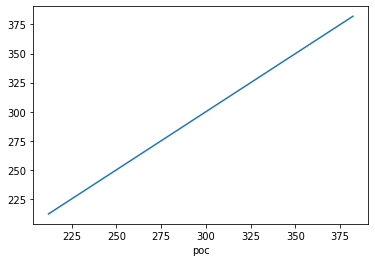

In [171]:
r.poc.last().plot()

In [136]:
pd.to_datetime(short_call['date']).dt.groupby

AttributeError: 'DatetimeProperties' object has no attribute 'groupby'

<AxesSubplot:>

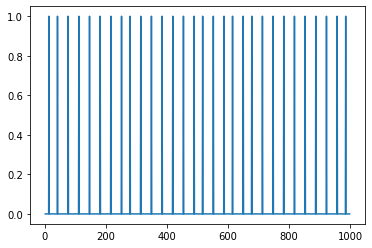

In [126]:
short_call['new_week'].plot()

In [198]:
short_call

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,weekly profit,date,wek,new_week
0,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 11:00:00,7,NaN
1,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 12:00:00,7,0.0
2,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 13:00:00,7,0.0
3,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 14:00:00,7,0.0
4,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 15:00:00,7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,293.680000,293.990000,290.400000,291.000000,7883773.0,304.057996,319.260896,NaN,NaN,NaN,2022-09-13 12:00:00,37,0.0
996,291.000000,293.280000,290.670000,292.300000,5298142.0,304.057996,319.260896,NaN,NaN,NaN,2022-09-13 13:00:00,37,0.0
997,292.270000,295.500000,291.780000,294.830000,9703434.0,304.017575,319.218454,NaN,NaN,NaN,2022-09-13 14:00:00,37,0.0
998,294.830000,295.970000,293.000000,294.100000,7136008.0,304.017575,319.218454,NaN,NaN,NaN,2022-09-13 15:00:00,37,0.0


In [200]:
short_call['week'] = pd.to_datetime(short_call['date']).dt.week

In [201]:
g = short_call.groupby('week')

In [202]:
options_exp = g.date.last()

In [206]:
options_exp

week
7      2022-02-18 16:00:00
8      2022-02-25 16:00:00
9      2022-03-04 16:00:00
10     2022-03-11 16:00:00
11     2022-03-18 16:00:00
12     2022-03-25 16:00:00
13     2022-04-01 16:00:00
14     2022-04-08 16:00:00
15     2022-04-14 16:00:00
16     2022-04-22 16:00:00
17     2022-04-29 16:00:00
18     2022-05-06 16:00:00
19     2022-05-13 16:00:00
20     2022-05-20 16:00:00
21     2022-05-27 16:00:00
22     2022-06-03 16:00:00
23     2022-06-10 16:00:00
24     2022-06-17 16:00:00
25     2022-06-24 16:00:00
26     2022-07-01 16:00:00
27     2022-07-08 16:00:00
28     2022-07-15 16:00:00
29     2022-07-22 16:00:00
30     2022-07-29 16:00:00
31     2022-08-05 16:00:00
32     2022-08-12 16:00:00
33     2022-08-19 16:00:00
34     2022-08-26 16:00:00
35     2022-09-02 16:00:00
36     2022-09-09 16:00:00
37     2022-09-13 16:00:00
Name: date, dtype: object

In [204]:
short_call['week']

0       7
1       7
2       7
3       7
4       7
       ..
995    37
996    37
997    37
998    37
999    37
Name: week, Length: 1000, dtype: int64

In [207]:
df1 = short_call

In [208]:
df2 = options_exp

In [211]:
d = df1.merge(df2,left_on='week', right_on='week')

In [212]:
d.head(50)

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,weekly profit,date_x,wek,new_week,week,date_y
0,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 11:00:00,7,NaN,7,2022-02-18 16:00:00
1,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 12:00:00,7,0.0,7,2022-02-18 16:00:00
2,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 13:00:00,7,0.0,7,2022-02-18 16:00:00
3,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 14:00:00,7,0.0,7,2022-02-18 16:00:00
4,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 15:00:00,7,0.0,7,2022-02-18 16:00:00
5,292.746637,293.566637,291.353304,292.116637,10635943.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 16:00:00,7,0.0,7,2022-02-18 16:00:00
6,295.333304,295.489970,287.003305,291.833304,9677074.0,NaN,NaN,NaN,NaN,NaN,2022-02-18 10:00:00,7,0.0,7,2022-02-18 16:00:00
7,291.879971,291.976637,283.896638,284.349972,11894104.0,NaN,NaN,NaN,NaN,NaN,2022-02-18 11:00:00,7,0.0,7,2022-02-18 16:00:00
8,284.264972,284.539972,280.773305,282.109972,10768594.0,NaN,NaN,NaN,NaN,NaN,2022-02-18 12:00:00,7,0.0,7,2022-02-18 16:00:00
9,282.113305,284.443305,281.053305,281.189972,5791156.0,NaN,NaN,NaN,NaN,NaN,2022-02-18 13:00:00,7,0.0,7,2022-02-18 16:00:00


In [213]:
recent

,open,high,low,close,volume,poc,week
datetime,,,,,,,
2022-02-17 11:00:00,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,7
2022-02-17 12:00:00,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,7
2022-02-17 13:00:00,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,7
2022-02-17 14:00:00,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,7
2022-02-17 15:00:00,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,7
...,...,...,...,...,...,...,...
2022-09-13 12:00:00,293.680000,293.990000,290.400000,291.000000,7883773.0,304.057996,37
2022-09-13 13:00:00,291.000000,293.280000,290.670000,292.300000,5298142.0,304.057996,37
2022-09-13 14:00:00,292.270000,295.500000,291.780000,294.830000,9703434.0,304.017575,37


In [214]:
short_call = concat_dfs(recent, get_poc(df, 30))
short_call = short_call.rename(columns={'open': 'underlying open', 'high': 'underlying high',
                                        'low': 'underlying low', 'close': 'underlying close'})
short_call['strike'] = short_call['poc'] * (1 + 5 / 100.)
short_call['call open'] = np.nan
short_call['call close'] = np.nan
short_call['hourly profit'] = np.nan
short_call['date'] = pd.to_datetime(short_call.index)
short_call = short_call.reset_index(drop=True)
short_call['new_week'] = short_call['date'].dt.week.diff()
short_call['week'] = short_call['date'].dt.week
g = short_call.groupby('week')
options_exp = g.date.last()
short_call = short_call.merge(options_exp, left_on='week', right_on='week')

In [217]:
short_call.head(50)

,underlying open,underlying high,underlying low,underlying close,volume,poc,week,strike,call open,call close,hourly profit,date_x,new_week,date_y
0,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 11:00:00,NaN,2022-02-18 16:00:00
1,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 12:00:00,0.0,2022-02-18 16:00:00
2,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 13:00:00,0.0,2022-02-18 16:00:00
3,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 14:00:00,0.0,2022-02-18 16:00:00
4,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 15:00:00,0.0,2022-02-18 16:00:00
5,292.746637,293.566637,291.353304,292.116637,10635943.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 16:00:00,0.0,2022-02-18 16:00:00
6,295.333304,295.489970,287.003305,291.833304,9677074.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-18 10:00:00,0.0,2022-02-18 16:00:00
7,291.879971,291.976637,283.896638,284.349972,11894104.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-18 11:00:00,0.0,2022-02-18 16:00:00
8,284.264972,284.539972,280.773305,282.109972,10768594.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-18 12:00:00,0.0,2022-02-18 16:00:00
9,282.113305,284.443305,281.053305,281.189972,5791156.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-18 13:00:00,0.0,2022-02-18 16:00:00


In [219]:
short_call['date_x'] - short_call['date_y']

0     -2 days +19:00:00
1     -2 days +20:00:00
2     -2 days +21:00:00
3     -2 days +22:00:00
4     -2 days +23:00:00
             ...       
995   -1 days +20:00:00
996   -1 days +21:00:00
997   -1 days +22:00:00
998   -1 days +23:00:00
999     0 days 00:00:00
Length: 1000, dtype: timedelta64[ns]

In [220]:
from options import short_calls_dynamic_POC

In [237]:
s = short_calls_dynamic_POC(recent, percent_offset=5, window=30)

In [238]:
s.head()

,underlying open,underlying high,underlying low,underlying close,volume,poc,week,strike,call open,call close,hourly profit,date_x,date_y,dte
0,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 11:00:00,2022-02-18 16:00:00,1 days 05:00:00
1,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 12:00:00,2022-02-18 16:00:00,1 days 04:00:00
2,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 13:00:00,2022-02-18 16:00:00,1 days 03:00:00
3,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 14:00:00,2022-02-18 16:00:00,1 days 02:00:00
4,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 15:00:00,2022-02-18 16:00:00,1 days 01:00:00


In [245]:
(s['dte']/pd.Timedelta(1.0,unit='D')).head(10)

0    1.208333
1    1.166667
2    1.125000
3    1.083333
4    1.041667
5    1.000000
6    0.250000
7    0.208333
8    0.166667
9    0.125000
Name: dte, dtype: float64

In [254]:
s = short_calls_dynamic_POC(recent, percent_offset=5, window=30)

In [255]:
s

,underlying open,underlying high,underlying low,underlying close,volume,poc,week,strike,call open,call close,hourly profit,date_x,date_y,dte,running profit
0,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 11:00:00,2022-02-18 16:00:00,1.208333,NaN
1,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 12:00:00,2022-02-18 16:00:00,1.166667,NaN
2,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 13:00:00,2022-02-18 16:00:00,1.125000,NaN
3,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 14:00:00,2022-02-18 16:00:00,1.083333,NaN
4,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 15:00:00,2022-02-18 16:00:00,1.041667,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,293.680000,293.990000,290.400000,291.000000,7883773.0,304.057996,37,319.260896,1.202368e-11,5.694503e-17,1.202362e-11,2022-09-13 12:00:00,2022-09-13 16:00:00,0.166667,-116.810076
996,291.000000,293.280000,290.670000,292.300000,5298142.0,304.057996,37,319.260896,5.694503e-17,3.864653e-20,5.690639e-17,2022-09-13 13:00:00,2022-09-13 16:00:00,0.125000,-116.810076
997,292.270000,295.500000,291.780000,294.830000,9703434.0,304.017575,37,319.218454,3.975720e-20,3.994785e-24,3.975321e-20,2022-09-13 14:00:00,2022-09-13 16:00:00,0.083333,-116.810076
998,294.830000,295.970000,293.000000,294.100000,7136008.0,304.017575,37,319.218454,3.994785e-24,1.076507e-48,3.994785e-24,2022-09-13 15:00:00,2022-09-13 16:00:00,0.041667,-116.810076


In [257]:
s.head(50)

,underlying open,underlying high,underlying low,underlying close,volume,poc,week,strike,call open,call close,hourly profit,date_x,date_y,dte,running profit
0,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 11:00:00,2022-02-18 16:00:00,1.208333,NaN
1,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 12:00:00,2022-02-18 16:00:00,1.166667,NaN
2,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 13:00:00,2022-02-18 16:00:00,1.125000,NaN
3,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 14:00:00,2022-02-18 16:00:00,1.083333,NaN
4,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 15:00:00,2022-02-18 16:00:00,1.041667,NaN
5,292.746637,293.566637,291.353304,292.116637,10635943.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-17 16:00:00,2022-02-18 16:00:00,1.000000,NaN
6,295.333304,295.489970,287.003305,291.833304,9677074.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-18 10:00:00,2022-02-18 16:00:00,0.250000,NaN
7,291.879971,291.976637,283.896638,284.349972,11894104.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-18 11:00:00,2022-02-18 16:00:00,0.208333,NaN
8,284.264972,284.539972,280.773305,282.109972,10768594.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-18 12:00:00,2022-02-18 16:00:00,0.166667,NaN
9,282.113305,284.443305,281.053305,281.189972,5791156.0,NaN,7,NaN,NaN,NaN,NaN,2022-02-18 13:00:00,2022-02-18 16:00:00,0.125000,NaN


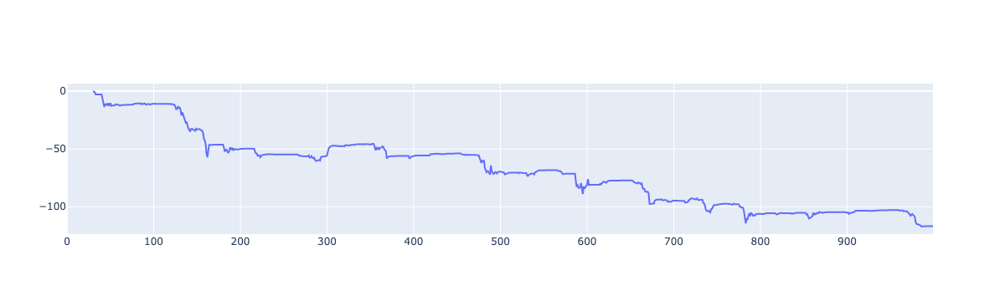

In [258]:
plot_line(s, value='running profit')

In [259]:
wsc = weekly_short_calls(recent)

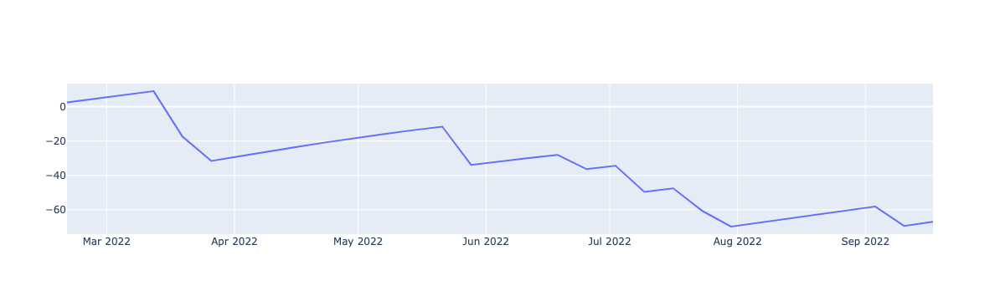

In [260]:
plot_line(wsc, value='running profit')

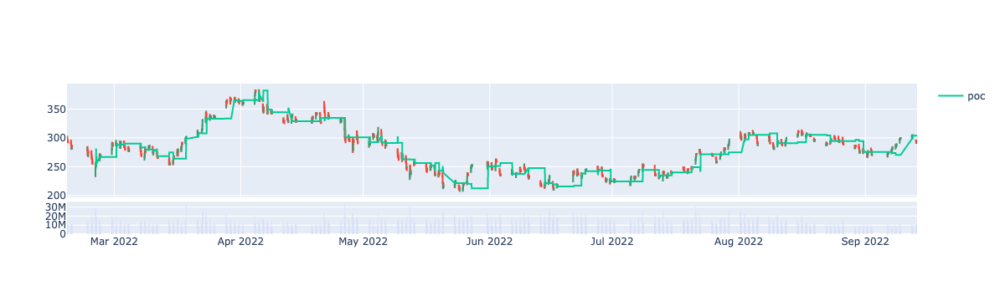

In [266]:
r = concat_dfs(recent, get_poc(recent, 30))
plot_candles(r, lines=['poc'])

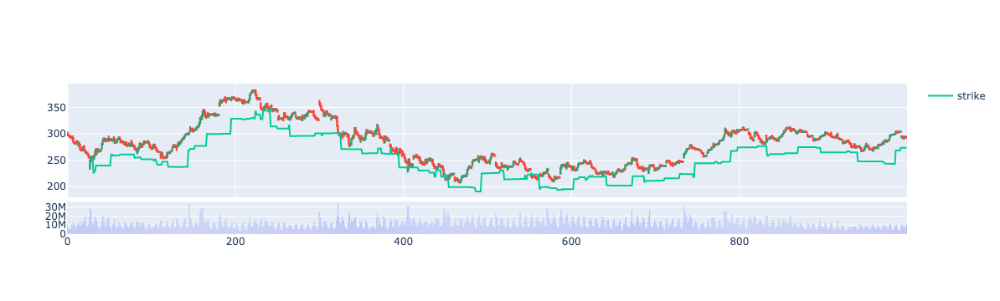

In [268]:
plot_candles(s, value = ['underlying open', 'underlying high', 'underlying low', 'underlying close'], lines=['strike'])

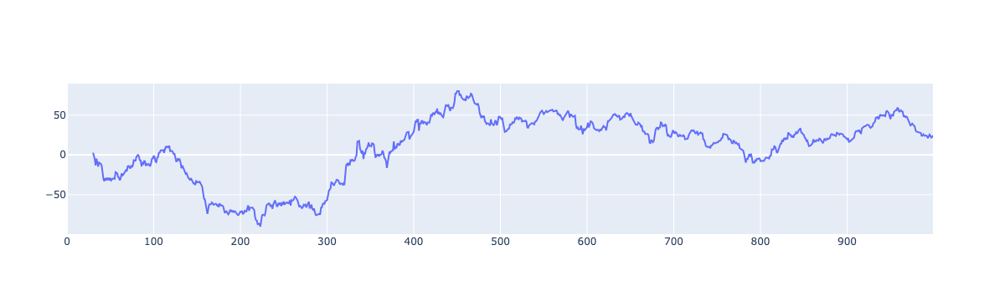

In [265]:
s = short_calls_dynamic_POC(recent, percent_offset=-10, window=30)
plot_line(s, value='running profit')

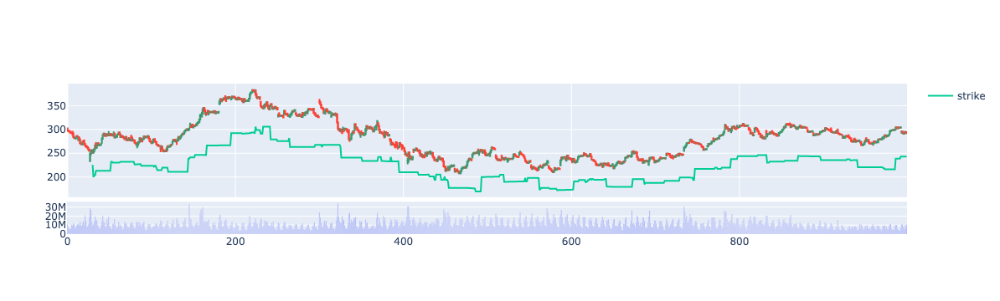

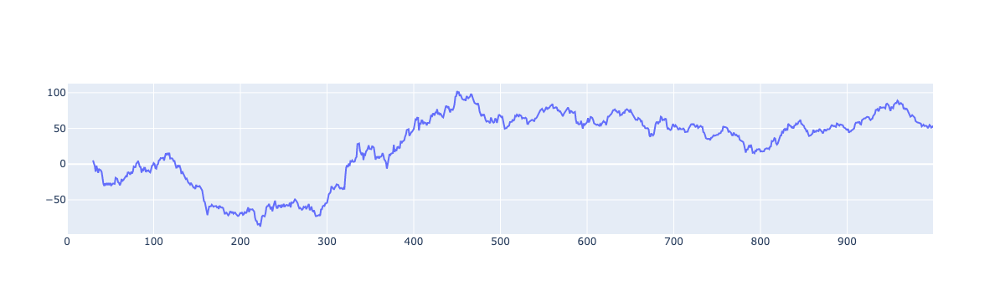

In [270]:
s = short_calls_dynamic_POC(recent, percent_offset=-20, window=30)
plot_candles(s, value = ['underlying open', 'underlying high', 'underlying low', 'underlying close'], lines=['strike'])
plot_line(s, value='running profit')

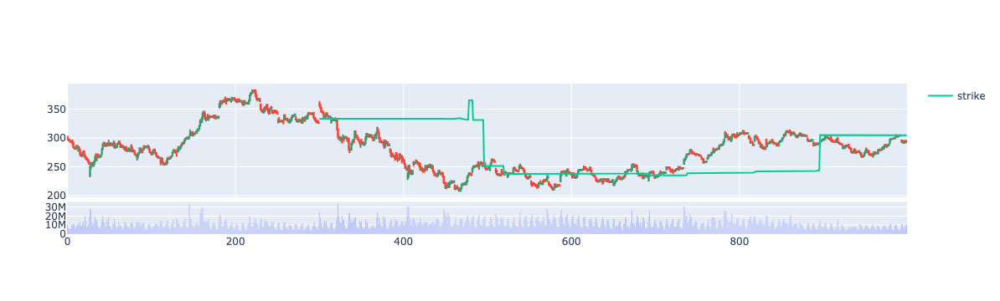

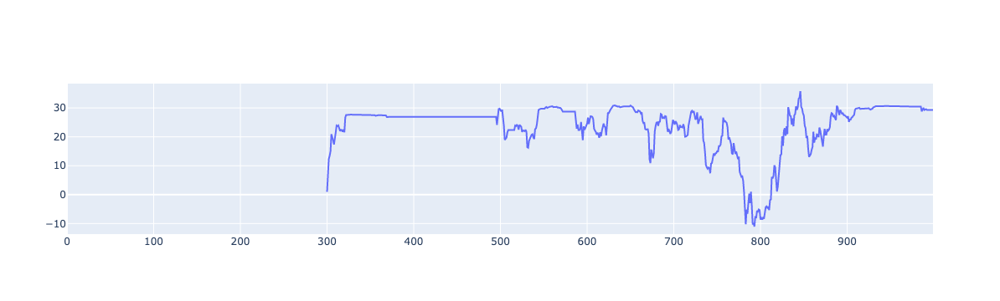

In [271]:
s = short_calls_dynamic_POC(recent, percent_offset=0, window=300)
plot_candles(s, value = ['underlying open', 'underlying high', 'underlying low', 'underlying close'], lines=['strike'])
plot_line(s, value='running profit')

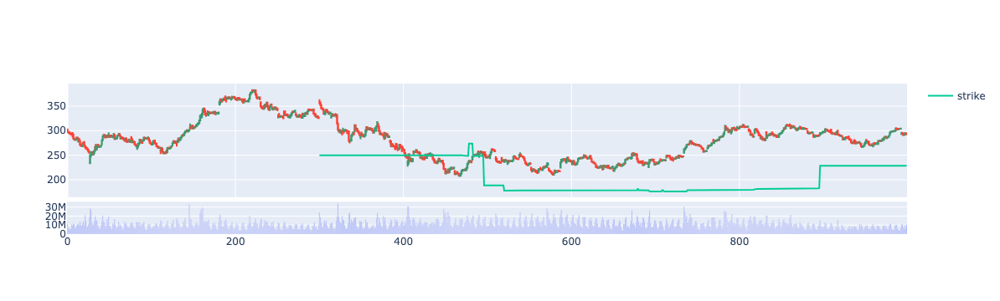

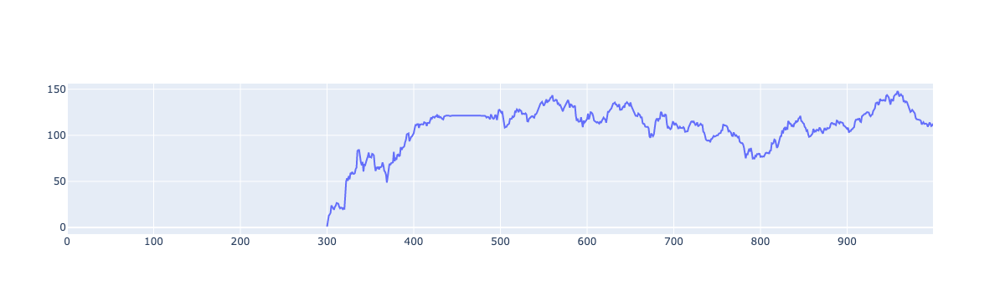

In [272]:
s = short_calls_dynamic_POC(recent, percent_offset=-25, window=300)
plot_candles(s, value = ['underlying open', 'underlying high', 'underlying low', 'underlying close'], lines=['strike'])
plot_line(s, value='running profit')

In [264]:
s.iloc[29:60]

,underlying open,underlying high,underlying low,underlying close,volume,poc,week,strike,call open,call close,hourly profit,date_x,date_y,dte,running profit
29,253.083308,257.316641,250.873308,256.263308,13086487.0,NaN,8,NaN,NaN,NaN,NaN,2022-02-24 12:00:00,2022-02-25 16:00:00,1.166667,NaN
30,256.266641,256.949974,250.163308,251.039975,9560209.0,281.792183,8,295.881792,1.305371e-06,1.609479e-08,1.289276e-06,2022-02-24 13:00:00,2022-02-25 16:00:00,1.125000,0.000001
31,250.999975,258.999974,250.166642,255.019974,10906840.0,249.880015,8,262.374016,2.197407e-01,6.444370e-01,-4.246964e-01,2022-02-24 14:00:00,2022-02-25 16:00:00,1.083333,-0.424695
32,255.036641,259.933307,251.799975,258.833307,14775553.0,254.778305,8,267.51722,1.550428e-01,4.511311e-01,-2.960883e-01,2022-02-24 15:00:00,2022-02-25 16:00:00,1.041667,-0.720783
33,258.866641,267.499973,258.363307,266.923307,19498436.0,254.806982,8,267.547331,4.517088e-01,2.666071e+00,-2.214362e+00,2022-02-24 16:00:00,2022-02-25 16:00:00,1.000000,-2.935145
34,269.886640,273.199973,260.789974,261.453307,15978629.0,266.595458,8,279.925231,1.004492e-02,3.068695e-07,1.004461e-02,2022-02-25 10:00:00,2022-02-25 16:00:00,0.250000,-2.925101
35,261.333307,268.409973,261.023307,266.466640,14769004.0,266.582913,8,279.912058,2.620968e-07,4.065514e-05,-4.039305e-05,2022-02-25 11:00:00,2022-02-25 16:00:00,0.208333,-2.925141
36,266.419973,271.599973,265.433307,271.189973,9968734.0,266.55475,8,279.882487,3.969458e-05,2.500551e-03,-2.460857e-03,2022-02-25 12:00:00,2022-02-25 16:00:00,0.166667,-2.927602
37,271.203306,271.609973,265.516640,266.223307,7618126.0,266.516567,8,279.842395,2.646269e-03,9.009016e-08,2.646179e-03,2022-02-25 13:00:00,2022-02-25 16:00:00,0.125000,-2.924956
38,266.199973,268.429973,264.849974,267.299973,6419737.0,266.443828,8,279.766019,9.981222e-08,2.298706e-09,9.751351e-08,2022-02-25 14:00:00,2022-02-25 16:00:00,0.083333,-2.924956


In [261]:
wsc.head()

,underlying open,underlying high,underlying low,underlying close,volume,strike,call open,call close,weekly profit,date,running profit
0,302.459970,302.459970,281.229972,285.659971,112299184.0,317.582968,2.392834,0.000000,2.392834,2022-02-19 09:30:00,2.392834
1,277.856639,281.499972,233.463310,269.956640,365703165.0,291.749471,2.198191,0.000000,2.198191,2022-02-26 09:30:00,4.591025
2,271.906639,292.773304,271.906639,279.429972,361427246.0,285.501971,2.151119,0.000000,2.151119,2022-03-05 09:30:00,6.742144
3,285.873305,285.873305,265.209973,265.116640,321703470.0,300.166970,2.261613,0.000000,2.261613,2022-03-12 09:30:00,9.003756
4,260.303307,300.656637,253.783308,301.796636,370315043.0,273.318473,2.059322,28.478164,-26.418842,2022-03-19 09:30:00,-17.415085


In [166]:
from monte_carlo import iterate_strategy

offsets= np.arange(-50,55,5)
result_list = iterate_strategy(weekly_short_calls, r, offsets)

In [170]:
result_list[0]

,underlying open,underlying high,underlying low,underlying close,volume,strike,call open,call close,weekly profit,date,running profit
0,302.459970,302.459970,281.229972,285.659971,112299184.0,151.229985,151.292121,134.429987,16.862135,2022-02-19 09:30:00,16.862135
1,277.856639,281.499972,233.463310,269.956640,365703165.0,138.928319,138.985402,131.028320,7.957081,2022-02-26 09:30:00,24.819216
2,271.906639,292.773304,271.906639,279.429972,361427246.0,135.953320,136.009179,143.476652,-7.467473,2022-03-05 09:30:00,17.351743
3,285.873305,285.873305,265.209973,265.116640,321703470.0,142.936652,142.995381,122.179988,20.815394,2022-03-12 09:30:00,38.167137
4,260.303307,300.656637,253.783308,301.796636,370315043.0,130.151654,130.205130,171.644983,-41.439853,2022-03-19 09:30:00,-3.272716
5,305.016636,345.269965,304.373303,336.879966,421044307.0,152.508318,152.570980,184.371648,-31.800668,2022-03-26 09:30:00,-35.073385
6,354.999964,368.899963,354.999964,361.529964,315782236.0,177.499982,177.572912,184.029982,-6.457069,2022-04-02 09:30:00,-41.530454
7,363.166630,382.403295,342.253299,341.829966,369044633.0,181.583315,181.657923,160.246651,21.411272,2022-04-09 09:30:00,-20.119181
8,326.713301,339.409966,326.713301,328.333301,221665522.0,163.356650,163.423769,164.976650,-1.552881,2022-04-16 09:30:00,-21.672062
9,329.729967,358.533297,325.906634,335.016633,320584643.0,164.864984,164.932722,170.151650,-5.218927,2022-04-23 09:30:00,-26.890989


In [200]:
from plotly.colors import n_colors
n_colors('rgb(0, 0, 0)', 'rgb(255, 255, 255)', 15, colortype='rgb')

['rgb(0.0, 0.0, 0.0)',
 'rgb(18.214285714285715, 18.214285714285715, 18.214285714285715)',
 'rgb(36.42857142857143, 36.42857142857143, 36.42857142857143)',
 'rgb(54.642857142857146, 54.642857142857146, 54.642857142857146)',
 'rgb(72.85714285714286, 72.85714285714286, 72.85714285714286)',
 'rgb(91.07142857142858, 91.07142857142858, 91.07142857142858)',
 'rgb(109.28571428571429, 109.28571428571429, 109.28571428571429)',
 'rgb(127.5, 127.5, 127.5)',
 'rgb(145.71428571428572, 145.71428571428572, 145.71428571428572)',
 'rgb(163.92857142857144, 163.92857142857144, 163.92857142857144)',
 'rgb(182.14285714285717, 182.14285714285717, 182.14285714285717)',
 'rgb(200.35714285714286, 200.35714285714286, 200.35714285714286)',
 'rgb(218.57142857142858, 218.57142857142858, 218.57142857142858)',
 'rgb(236.7857142857143, 236.7857142857143, 236.7857142857143)',
 'rgb(255.0, 255.0, 255.0)']

In [203]:
import plotly.express as px

n_colors = 25
colors = px.colors.sample_colorscale("viridis", [n/(n_colors -1) for n in range(n_colors)])
colors

['rgb(68, 1, 84)',
 'rgb(70, 16, 98)',
 'rgb(71, 30, 111)',
 'rgb(71, 44, 122)',
 'rgb(67, 56, 128)',
 'rgb(63, 69, 135)',
 'rgb(59, 81, 138)',
 'rgb(54, 92, 140)',
 'rgb(49, 104, 142)',
 'rgb(45, 114, 142)',
 'rgb(41, 124, 142)',
 'rgb(37, 133, 141)',
 'rgb(34, 144, 140)',
 'rgb(32, 154, 138)',
 'rgb(37, 164, 133)',
 'rgb(45, 174, 127)',
 'rgb(53, 183, 121)',
 'rgb(74, 192, 109)',
 'rgb(96, 200, 96)',
 'rgb(119, 208, 82)',
 'rgb(146, 214, 65)',
 'rgb(172, 220, 49)',
 'rgb(199, 224, 42)',
 'rgb(226, 228, 39)',
 'rgb(253, 231, 37)']

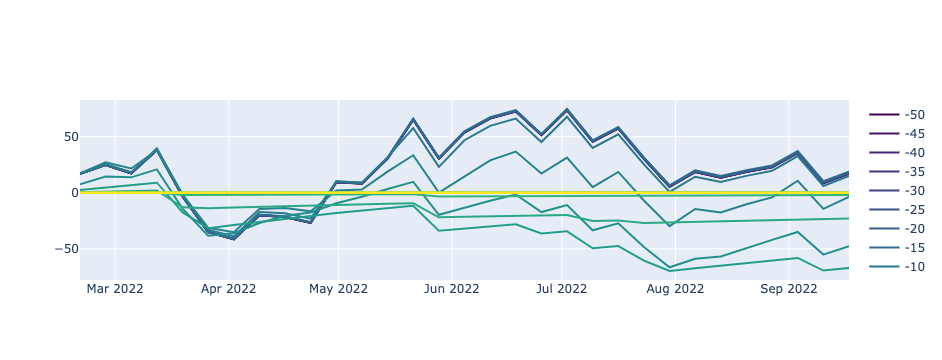

In [204]:
plots(result_list, offsets, {'show_afterhours':True})

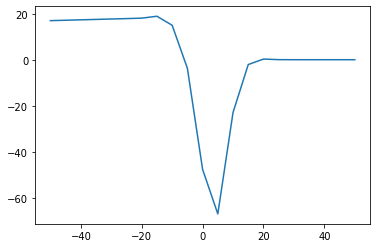

In [205]:
import plots
plots.compare_final_profits(result_list, offsets)

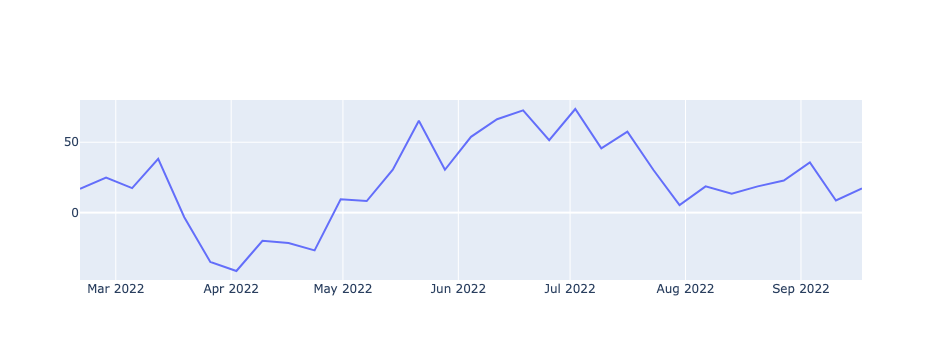

In [173]:
from plots import plots
plot_line(result_list[1], value='running profit')

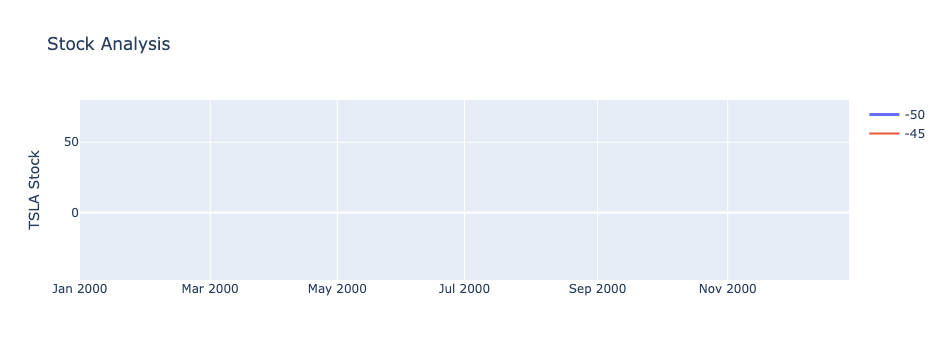

In [175]:
plots(result_list[:2], offsets[:2])

In [182]:
import plotly.graph_objects as go
fig = go.Figure(data=[go.Scatter(x=result_list[0]['date'], y=result_list[0]['running profit'])])

In [178]:
from plots import update_fig

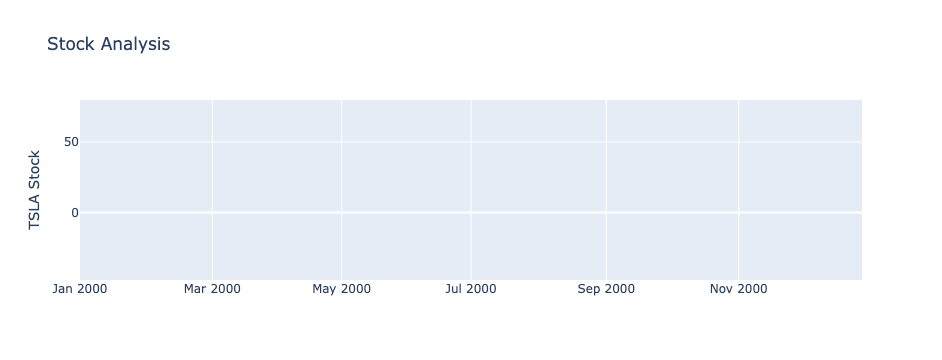

In [183]:
update_fig(fig)

In [184]:
result_list[0]['date'].array

<DatetimeArray>
['2022-02-19 09:30:00', '2022-02-26 09:30:00', '2022-03-05 09:30:00',
 '2022-03-12 09:30:00', '2022-03-19 09:30:00', '2022-03-26 09:30:00',
 '2022-04-02 09:30:00', '2022-04-09 09:30:00', '2022-04-16 09:30:00',
 '2022-04-23 09:30:00', '2022-04-30 09:30:00', '2022-05-07 09:30:00',
 '2022-05-14 09:30:00', '2022-05-21 09:30:00', '2022-05-28 09:30:00',
 '2022-06-04 09:30:00', '2022-06-11 09:30:00', '2022-06-18 09:30:00',
 '2022-06-25 09:30:00', '2022-07-02 09:30:00', '2022-07-09 09:30:00',
 '2022-07-16 09:30:00', '2022-07-23 09:30:00', '2022-07-30 09:30:00',
 '2022-08-06 09:30:00', '2022-08-13 09:30:00', '2022-08-20 09:30:00',
 '2022-08-27 09:30:00', '2022-09-03 09:30:00', '2022-09-10 09:30:00',
 '2022-09-17 09:30:00']
Length: 31, dtype: datetime64[ns]

In [181]:
result_list[0]['running profit']

0     16.862135
1     24.819216
2     17.351743
3     38.167137
4     -3.272716
5    -35.073385
6    -41.530454
7    -20.119181
8    -21.672062
9    -26.890989
10     9.386075
11     8.105079
12    30.435686
13    65.188275
14    30.356465
15    53.762772
16    66.249701
17    72.535513
18    51.334961
19    73.492856
20    45.485278
21    57.323683
22    30.130685
23     5.243275
24    18.468513
25    13.332416
26    18.501078
27    22.607731
28    35.455870
29     8.461878
30    16.983630
Name: running profit, dtype: float64

In [189]:
df = result_list[0]

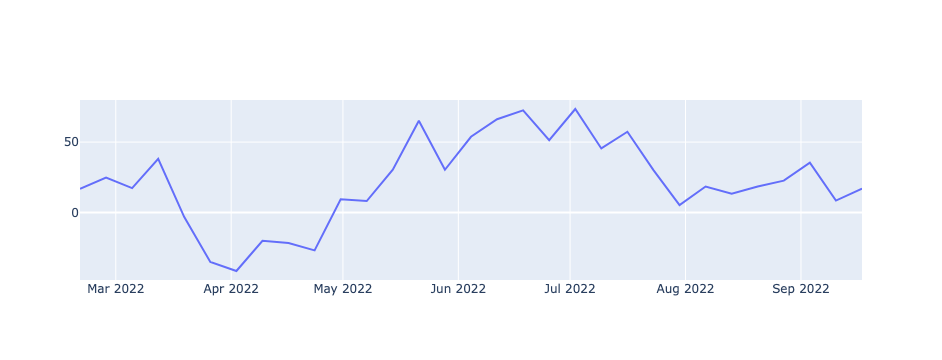

In [195]:
index = df['date'] if 'date' in df.columns else df.index
fig = go.Figure(data=[go.Scatter(x=index, y=df['running profit'])])
update_fig(fig, show_afterhours=True, log_y=False)

In [99]:
tsla_weekly = aggregate(tsla, freq='weekly')

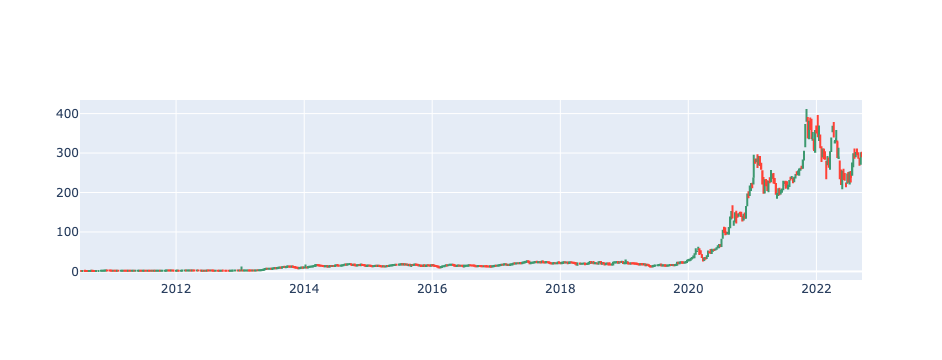

In [100]:
plot_candles(tsla_weekly, show_afterhours=True)

In [101]:
short_call = weekly_short_calls(tsla)

In [103]:
short_call

,underlying open,underlying high,underlying low,underlying close,strike,call open,call close,weekly profit,date,running profit
0,1.266667,1.730666,1.266667,1.280000,1.330000,0.010021,0.0000,0.010021,2010-07-02 09:30:00,0.010021
1,1.333333,1.333333,1.076000,1.160000,1.400000,0.010548,0.0000,0.010548,2010-07-09 09:30:00,0.020569
2,1.196667,1.380000,1.170000,1.380000,1.256500,0.009467,0.1235,-0.114033,2010-07-16 09:30:00,-0.093464
3,1.423333,1.456667,1.366667,1.419333,1.494500,0.011260,0.0000,0.011260,2010-07-23 09:30:00,-0.082203
4,1.433333,1.433333,1.346667,1.329333,1.505000,0.011339,0.0000,0.011339,2010-07-30 09:30:00,-0.070864
...,...,...,...,...,...,...,...,...,...,...
633,301.773303,311.666635,299.236637,296.666637,316.861968,2.387401,0.0000,2.387401,2022-08-20 09:30:00,-276.951290
634,292.136637,302.300000,291.519971,288.090000,306.743469,2.311163,0.0000,2.311163,2022-08-27 09:30:00,-274.640127
635,283.000000,288.000000,272.590000,270.210000,297.150000,2.238881,0.0000,2.238881,2022-09-03 09:30:00,-272.401246
636,272.630000,291.600000,272.630000,299.680000,286.261500,2.156842,13.4185,-11.261658,2022-09-10 09:30:00,-283.662904


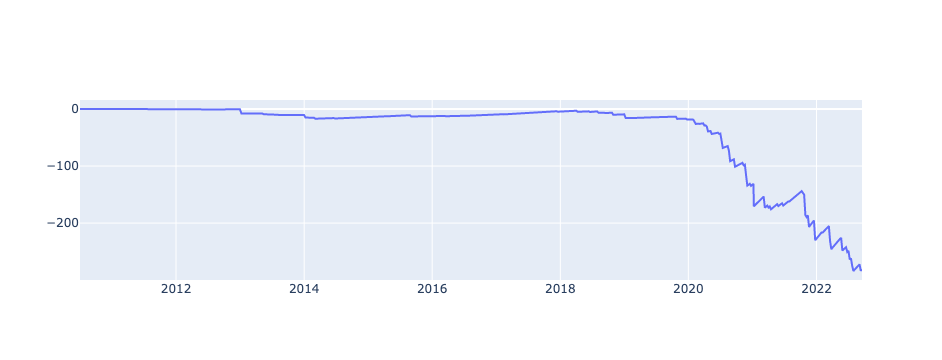

In [104]:
plot_line(short_call, value='running profit', show_afterhours=True)

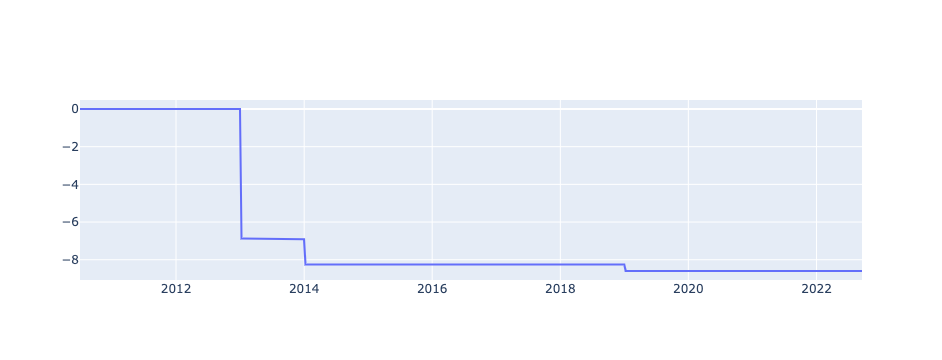

In [112]:
short_call = weekly_short_calls(tsla, 35)
plot_line(short_call, value='running profit', show_afterhours=True)

In [113]:
leap_hourly = get_option_history(tsla_weekly, strike=20, expiration='9/30/2022', risk_free=3)

In [114]:
leap_hourly

,option value,intrinsic value,time value,delta,gamma,theta,vega,rho,DTE
2010-07-02 09:30:00,0.274851,0,0.274851,0.360905,0.157686,-0.000115,0.016776,0.022925,4472
2010-07-09 09:30:00,0.231995,0,0.231995,0.340468,0.17049,-0.000102,0.014874,0.019933,4465
2010-07-16 09:30:00,0.309954,0,0.309954,0.374668,0.148307,-0.000126,0.018283,0.025293,4458
2010-07-23 09:30:00,0.323895,0,0.323895,0.379669,0.144907,-0.00013,0.018867,0.026216,4451
2010-07-30 09:30:00,0.289481,0,0.289481,0.365505,0.152966,-0.00012,0.017443,0.023912,4444
...,...,...,...,...,...,...,...,...,...
2022-08-20 09:30:00,276.732282,276.666637,0.065645,1.0,0.0,-0.001638,0.0,0.021846,40
2022-08-27 09:30:00,268.144173,268.09,0.054173,1.0,0.0,-0.001639,0.0,0.018033,33
2022-09-03 09:30:00,250.252694,250.21,0.042694,1.0,0.0,-0.00164,0.0,0.014216,26
2022-09-10 09:30:00,279.711209,279.68,0.031209,1.0,0.0,-0.001641,0.0,0.010395,19


In [116]:
from options import PMCC

In [117]:
pmcc = PMCC(tsla_weekly)

In [118]:
pmcc

,leap weekly profit,leap running profit,date,short calls weekly profit,short calls running profit,total running profit
0,0,0,2010-07-02 09:30:00,0.010021,0.010021,0.010021
1,-0.105035,-0.105035,2010-07-09 09:30:00,0.010548,0.020569,-0.084466
2,0.192098,0.087063,2010-07-16 09:30:00,-0.114033,-0.093464,-0.0064
3,0.034329,0.121392,2010-07-23 09:30:00,0.011260,-0.082203,0.039189
4,-0.080057,0.041335,2010-07-30 09:30:00,0.011339,-0.070864,-0.029529
...,...,...,...,...,...,...
631,-3.364023,294.547594,2022-08-20 09:30:00,2.387401,-294.833698,-0.286104
632,-8.577327,285.970267,2022-08-27 09:30:00,2.311163,-292.522535,-6.552268
633,-17.880691,268.089576,2022-09-03 09:30:00,2.238881,-290.283653,-22.194077
634,29.469309,297.558885,2022-09-10 09:30:00,-11.261658,-301.545312,-3.986426


In [120]:
pmcc = PMCC(tsla_weekly)
pmcc

,leap weekly profit,leap running profit,date,short calls weekly profit,short calls running profit,total running profit
0,0,0,2010-07-02 09:30:00,0.010021,0.010021,0.010021
1,-0.106096,-0.106096,2010-07-09 09:30:00,0.010548,0.020569,-0.085527
2,0.194077,0.087981,2010-07-16 09:30:00,-0.114033,-0.093464,-0.005482
3,0.034682,0.122663,2010-07-23 09:30:00,0.011260,-0.082203,0.04046
4,-0.080742,0.041921,2010-07-30 09:30:00,0.011339,-0.070864,-0.028943
...,...,...,...,...,...,...
631,-3.364002,294.558296,2022-08-20 09:30:00,2.387401,-294.833698,-0.275402
632,-8.577307,285.980989,2022-08-27 09:30:00,2.311163,-292.522535,-6.541546
633,-17.88067,268.100319,2022-09-03 09:30:00,2.238881,-290.283653,-22.183335
634,29.469329,297.569648,2022-09-10 09:30:00,-11.261658,-301.545312,-3.975664


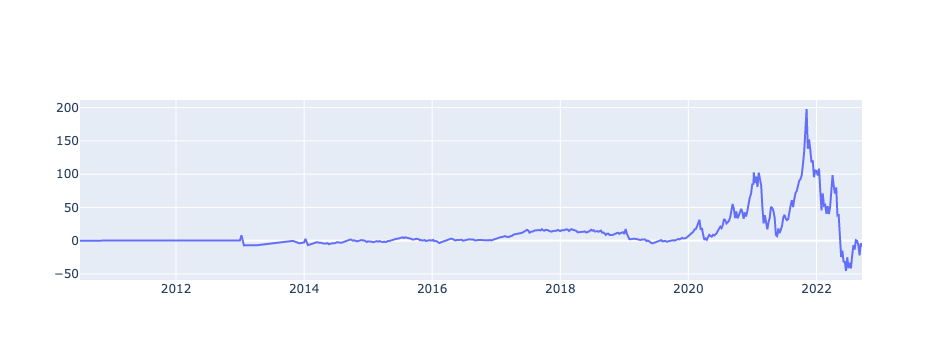

In [121]:
plot(pmcc, value='total running profit')

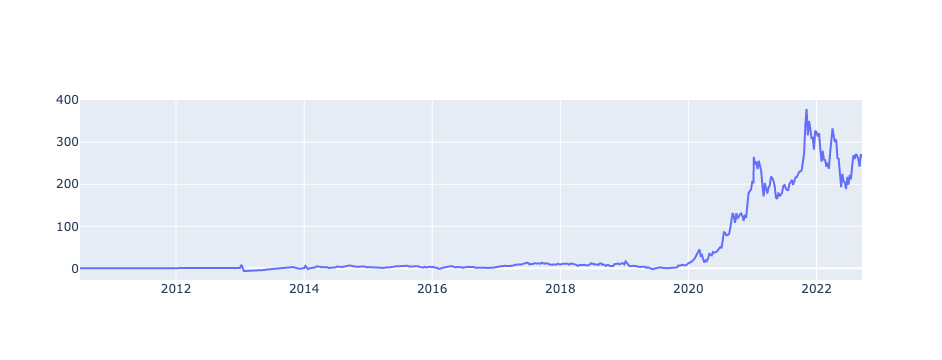

In [126]:
pmcc = PMCC(tsla_weekly, short_offset=25)
plot(pmcc, value='total running profit')

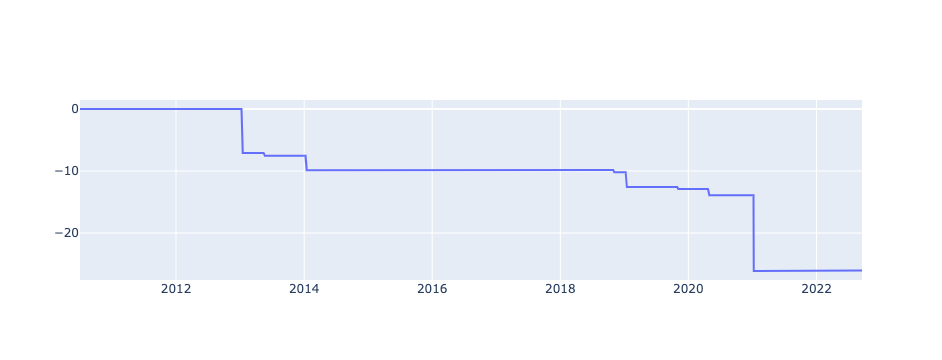

In [127]:
plot(pmcc, value='short calls running profit')

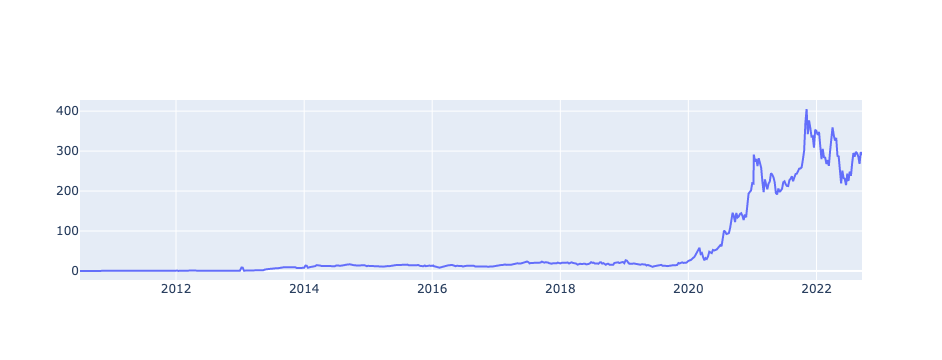

In [128]:
plot(pmcc, value='leap running profit')

In [133]:
1+(-50/100)

0.5

In [134]:
(1+-50/100.)

0.5

In [136]:
short_call

,underlying open,underlying high,underlying low,underlying close,strike,call open,call close,weekly profit,date,running profit
0,1.266667,1.730666,1.266667,1.280000,0.633333,0.633593,0.646667,-0.013073,2010-07-02 09:30:00,-0.013073
1,1.333333,1.333333,1.076000,1.160000,0.666667,0.666941,0.493333,0.173607,2010-07-09 09:30:00,0.160534
2,1.196667,1.380000,1.170000,1.380000,0.598333,0.598579,0.781667,-0.183087,2010-07-16 09:30:00,-0.022553
3,1.423333,1.456667,1.366667,1.419333,0.711667,0.711959,0.707667,0.004292,2010-07-23 09:30:00,-0.018261
4,1.433333,1.433333,1.346667,1.329333,0.716667,0.716961,0.612667,0.104294,2010-07-30 09:30:00,0.086034
...,...,...,...,...,...,...,...,...,...,...
633,301.773303,311.666635,299.236637,296.666637,150.886652,150.948647,145.779985,5.168662,2022-08-20 09:30:00,-199.107043
634,292.136637,302.300000,291.519971,288.090000,146.068319,146.128334,142.021681,4.106653,2022-08-27 09:30:00,-195.000389
635,283.000000,288.000000,272.590000,270.210000,141.500000,141.558139,128.710000,12.848139,2022-09-03 09:30:00,-182.152251
636,272.630000,291.600000,272.630000,299.680000,136.315000,136.371008,163.365000,-26.993992,2022-09-10 09:30:00,-209.146242


In [129]:
short_calls = []
for offset in range(-50, 55, 5):
    short_call = weekly_short_calls(tsla, offset)
    short_calls.append(short_call)

In [ ]:
[sc['running profit'] for sc in short_calls]

In [132]:
short_call.head()

,underlying open,underlying high,underlying low,underlying close,strike,call open,call close,weekly profit,date,running profit
0,1.266667,1.730666,1.266667,1.280000,1.900,4.645606e-13,0.0,4.645606e-13,2010-07-02 09:30:00,4.645606e-13
1,1.333333,1.333333,1.076000,1.160000,2.000,4.890112e-13,0.0,4.890112e-13,2010-07-09 09:30:00,9.535718e-13
2,1.196667,1.380000,1.170000,1.380000,1.795,4.388875e-13,0.0,4.388875e-13,2010-07-16 09:30:00,1.392459e-12
3,1.423333,1.456667,1.366667,1.419333,2.135,5.220194e-13,0.0,5.220194e-13,2010-07-23 09:30:00,1.914479e-12
4,1.433333,1.433333,1.346667,1.329333,2.150,5.256870e-13,0.0,5.256870e-13,2010-07-30 09:30:00,2.440166e-12


In [148]:
len(short_calls)

21

In [150]:
import plotly.graph_objects as go
fig = go.Figure(data=[go.Scatter(x=short_calls[0]['date'], y=short_calls[0]['running profit'])])
offset = np.arange(-50, 55, 5)
for i in range(1, len(short_calls)):
    print(offset[i])
    fig.add_scatter(x=short_calls[i]['date'], y=short_calls[i]['running profit'], name=str(offset[i]))

-45
-40
-35
-30
-25
-20
-15
-10
-5
0
5
10
15
20
25
30
35
40
45
50


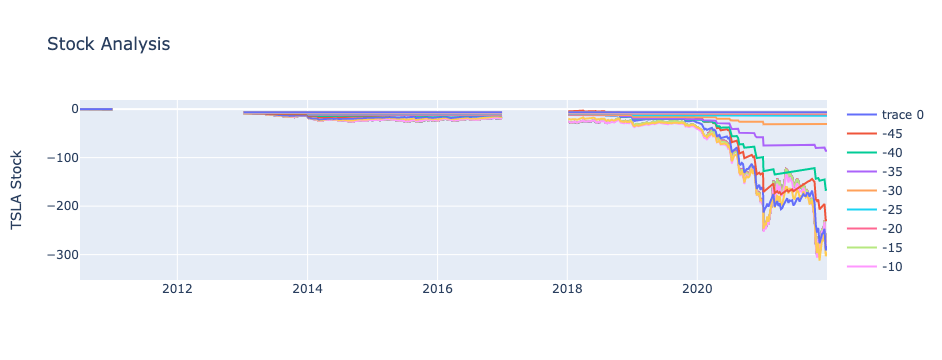

In [ ]:
from plots import update_fig
update_fig(fig)

In [147]:
np.arange(-50, 55, 5)

array([-50, -45, -40, -35, -30, -25, -20, -15, -10,  -5,   0,   5,  10,
        15,  20,  25,  30,  35,  40,  45,  50])

In [ ]:
import plotly.graph_objects as go
from plots import update_fig

In [ ]:
    offsets = np.arange(-50,55,5)

-45
-40
-35
-30
-25
-20
-15
-10
-5
0
5
10
15
20
25
30
35
40
45
50


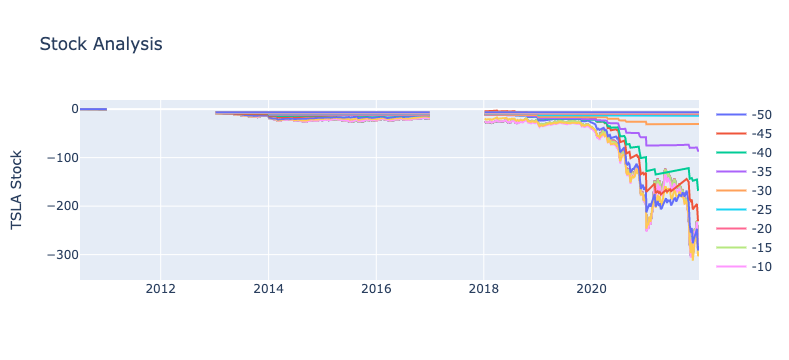

In [157]:
short_calls = []
offsets = np.arange(-50,55,5)
for offset in offsets:
    short_call = weekly_short_calls(tsla, offset)
    short_calls.append(short_call)

final_profit = []
fig = go.Figure(data=[go.Scatter(x=short_calls[0]['date'], 
                                 y=short_calls[0]['running profit'], 
                                 name=str(offsets[0]))])

for i in range(1, len(short_calls)):
    print(offsets[i])
    fig.add_scatter(x=short_calls[i]['date'], 
                    y=short_calls[i]['running profit'], 
                    name=str(offsets[i]))
update_fig(fig)

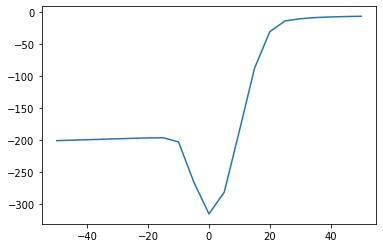

In [158]:
plt.plot(offsets, [sc['running profit'].iloc[-1] for sc in short_calls])

In [164]:
# LEAPS(df_minutely, percent_offset=-5)
LEAPS_list = []
offsets = np.arange(-50,55,5)
for offset in offsets:
    leaps = LEAPS(tsla, offset)
    LEAPS_list.append(leaps)

final_profit = []
fig = go.Figure(data=[go.Scatter(x=LEAPS_list[0]['date'], 
                                 y=LEAPS_list[0]['running profit'], 
                                 name=str(LEAPSs[0]))])

for i in range(1, len(LEAPSs)):
    print(offsets[i])
    fig.add_scatter(x=LEAPS_list[i]['date'], 
                    y=LEAPS_list[i]['running profit'], 
                    name=str(LEAPS_list[i]))
update_fig(fig)

NameError: name 'LEALEAPS_listPSs' is not defined

-45
-40
-35
-30
-25
-20
-15
-10
-5
0
5
10
15
20
25
30
35
40
45
50


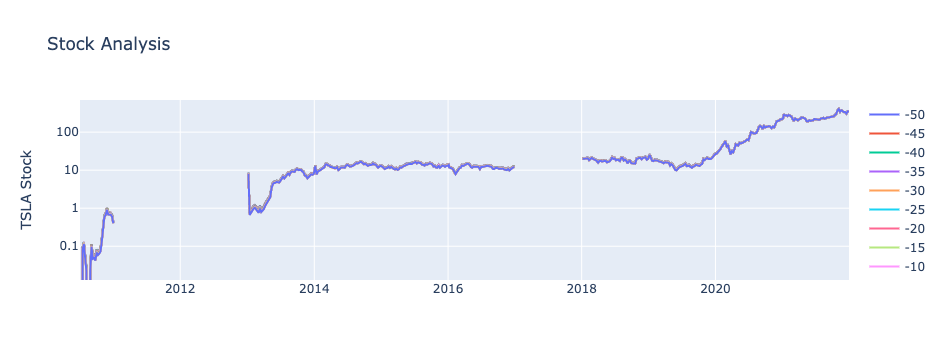

In [172]:

final_profit = []
fig = go.Figure(data=[go.Scatter(x=LEAPS_list[0]['date'], 
                                 y=LEAPS_list[0]['running profit'], 
                                 name=str(offsets[0]))])

for i in range(1, len(LEAPS_list)):
    print(offsets[i])
    fig.add_scatter(x=LEAPS_list[i]['date'], 
                    y=LEAPS_list[i]['running profit'], 
                    name=str(offsets[i]))
update_fig(fig, log_y=True)

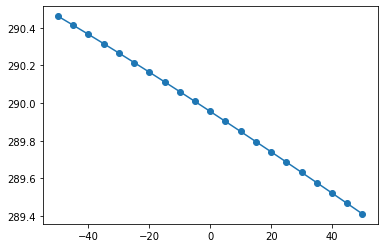

In [170]:
plt.plot(offsets, [l['running profit'].iloc[-1] for l in LEAPS_list], marker ='o')

In [173]:
from monte_carlo import iterate_strategy
offset_results = iterate_strategy(weekly_short_calls, tsla, offsets = np.arange(-50,55,5))

In [174]:
from plots import plots

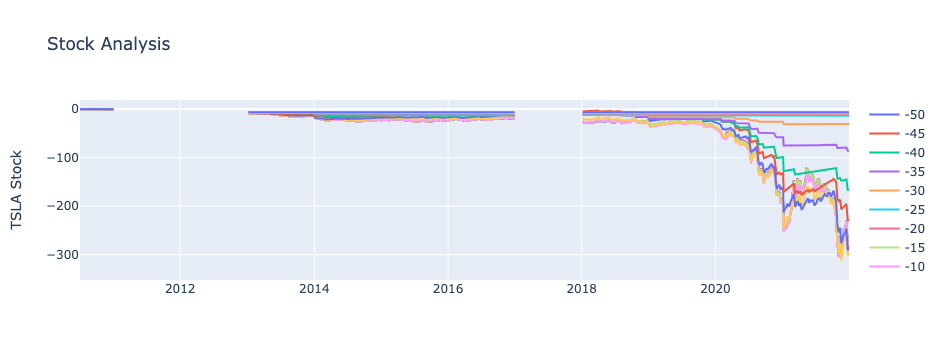

In [175]:
plots(offset_results,  offsets = np.arange(-50,55,5))